# Global Greening

## Installing & Importing Libraries

this notebook version is setup so we can run the model on VM workbench in Jupyter Lab and use tf.Datasets

In [15]:
import pickle
import numpy as np
import pandas as pd
import math
import time
from PIL import Image
# from patchify import patchify
# import albumentations as A
from IPython.display import SVG
#import graphviz
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil #, cv2
from google.cloud import storage

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model, image_dataset_from_directory
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, ZeroPadding2D, Dropout

from sklearn.preprocessing import MinMaxScaler

## Model information

[key link](https://github.com/kunnalparihar/Satellite-Image-Segmentation)

## Prepara Data Augmentation - ignore, not used

**Augmentation using Albumentations Library**

[Albumentations](https://albumentations.ai/) is a Python library for fast and flexible image augmentations. Albumentations efficiently implements a rich variety of image transform operations that are optimized for performance, and does so while providing a concise, yet powerful image augmentation interface for different computer vision tasks, including object classification, segmentation, and detection.

Data augmentation is done by the following techniques:

1. Random Cropping - left out since we will have same size pictures
2. Horizontal Flipping
3. Vertical Flipping
4. Rotation
5. Random Brightness & Contrast
6. Contrast Limited Adaptive Histogram Equalization (CLAHE)
7. Grid Distortion
8. Optical Distortion

In [2]:
# # function to augment
# def augment(): #width, height
#     transform = A.Compose([
# #        A.RandomCrop(width=width, height=height, p=1.0),
#         A.HorizontalFlip(p=1.0),
#         A.VerticalFlip(p=1.0),
#         A.Rotate(limit=[60, 300], p=1.0, interpolation=cv2.INTER_NEAREST),
#         A.RandomBrightnessContrast(brightness_limit=[-0.2, 0.3], contrast_limit=0.2, p=1.0),
#         A.OneOf([
#             A.CLAHE (clip_limit=1.5, tile_grid_size=(8, 8), p=0.5),
#             A.GridDistortion(p=0.5),
#             A.OpticalDistortion(distort_limit=1, shift_limit=0.5, interpolation=cv2.INTER_NEAREST, p=0.5),
#         ], p=1.0),
#     ], p=1.0)
    
#     return transform

In [3]:
# # visualize the augmentations

# def visualize(image, mask, original_image=None, original_mask=None):
#     fontsize = 16

#     if original_image is None and original_mask is None:
#         f, ax = plt.subplots(2, 1, figsize=(10, 10)) 

#         ax[0].imshow(image)
#         ax[1].imshow(mask)
#     else:
#         f, ax = plt.subplots(2, 2, figsize=(16, 12))  

#         ax[0, 0].imshow(original_image)
#         ax[0, 0].set_title('Original Image', fontsize=fontsize)

#         ax[1, 0].imshow(original_mask)
#         ax[1, 0].set_title('Original Mask', fontsize=fontsize)

#         ax[0, 1].imshow(image)
#         ax[0, 1].set_title('Transformed Image', fontsize=fontsize)

#         ax[1, 1].imshow(mask)
#         ax[1, 1].set_title('Transformed Mask', fontsize=fontsize)
        
#     plt.savefig('sample_augmented_image.png', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)

## Key Params

Please make sure to create local folder structure in following way:

     |
     |---- raw_data
     |    |---- zoomed_photos
     |    |---- masks
     |
     |---- training_outputs
     |    |---- metrics
     |    |---- models
     |    |---- params

there will a folder for predictions as well, but will sort it out later

In [4]:
# parameters
DATA_SIZE=1500
LAND_USE_ARRAY_SIZE=250
TRIAL_SIZE=1000     # after running it once change to a larger number (up to 15000)
LOAD_CHUNK_SIZE=TRIAL_SIZE
DATA_RUN = 'local_VM' #  select from these options:'gcp' local_VM' , 'local' 

# on VM workbench in GCP when loading data locally from VM  - change to what is has to be 
VM_dataset_folder = "/home/jupyter/GlobalGreening"  # need to change this 
VM_images_dir = "zoomed_photos"
VM_masks_dir = "masks"
VM_output_folder = "/home/jupyter/GlobalGreening/training_outputs" # need to change this 


In [5]:
# Define where to store model outputs

timestamp = time.strftime("%Y%m%d-%H%M%S")

if DATA_RUN == 'local_VM':
    model_path = os.path.join(VM_output_folder, "models", f"{timestamp}_InceptionResNetV2-UNet.h5")
    results_path = os.path.join(VM_output_folder, "metrics", f"{timestamp}_model_training.csv")
    model_metrics_plot_path = os.path.join(VM_output_folder, "metrics", f"{timestamp}_model_metrics_plot.png")
    predictions_dir = os.path.join(VM_output_folder, f"{timestamp}_predictions")
        
print("--------")
print(f' model path is {model_path}')
print("--------")
print(f' results path is {results_path}')
print("--------")
print(f' model metrics path is {model_metrics_plot_path}')
print("--------")
print(f'predictions folder is {predictions_dir}')

--------
 model path is /home/jupyter/GlobalGreening/training_outputs/models/20230613-110116_InceptionResNetV2-UNet.h5
--------
 results path is /home/jupyter/GlobalGreening/training_outputs/metrics/20230613-110116_model_training.csv
--------
 model metrics path is /home/jupyter/GlobalGreening/training_outputs/metrics/20230613-110116_model_metrics_plot.png
--------
predictions folder is /home/jupyter/GlobalGreening/training_outputs/20230613-110116_predictions


In [6]:
#AUTOTUNE = tf.data.experimental.AUTOTUNE

In [7]:
!pwd

/home/jupyter/GlobalGreening


In [8]:
# ***** NOT USED YET (folder to save predictions) ****** 

# # please make predictions directory based on what was printed out
# # check if any folders need to be created and adjust the below command 
# (see pwd path above)

# !mkdir -p ../training_outputs/20230610-132230_predictions

## Loading the Data

### Some checks before - delete all later

In [9]:
masks = os.listdir("./masks")  # here all masks, 
# split test
# .shuffle for test

In [10]:
masks[0].replace('mask','image').replace('.npy','.png')

'image2336_-107.98_40.42.png'

In [11]:
mask_list = tf.data.Dataset.list_files('masks/*.npy' , shuffle=False)
type(mask_list), len(mask_list)

2023-06-13 11:01:19.080456: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-13 11:01:19.093763: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-13 11:01:19.095490: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-13 11:01:19.098769: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

(tensorflow.python.data.ops.from_tensor_slices_op.TensorSliceDataset, 15416)

In [12]:
mask_list.as_numpy_iterator().__next__()

b'masks/mask0_-109.0_37.0.npy'

In [13]:
image_list = tf.data.Dataset.list_files('zoomed_photos/*.png' , shuffle=False)
type(image_list), len(image_list)

(tensorflow.python.data.ops.from_tensor_slices_op.TensorSliceDataset, 15415)

In [14]:
raw_file = tf.cast(np.load(mask), dtype=tf.float32) #, 
#data = tf.numpy_function(raw_file, tf.io.read_file(masks[0])

NameError: name 'mask' is not defined

In [ ]:
raw_file

In [ ]:
plt.imshow(raw_file)

In [ ]:
masks_example = np.load('masks/mask0_-109.0_37.0.npy')
masks_example.dtype

In [ ]:
plt.imshow(masks_example)

### Not used functions

In [ ]:
# function to read and load images (not used)

def load_and_preprocess_image(path):
  image = tf.read_file(path)
  return preprocess_image(image)

def preprocess_image(image):
  image = tf.image.decode_png(image, channels=3) 
  image /= 255.0  # normalize to [0,1] range
  return image

# path_ds = tf.data.Dataset.from_tensor_slices(all_image_paths)
# image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)

In [ ]:
# function to read and load masks which are numpy array
def load_mask(file):
    #print(file)
    return tf.cast(np.load(file) , dtype=tf.float32)

def process_mask(file_path):
    data = tf.numpy_function(load_mask, [file_path], tf.float32)
    return data

In [ ]:
### not used

def read_data_from_masks(mask_path: str):
    image_path = mask_path.replace('mask','image').replace('.npy','.png')

#    image = tf.io.image.read_image()  # this part from Ollie

    raw = tf.read_file(image_path)
    image = tf.decode_png(image, channels=3)
    image = image / 255.0
    
#     mask = tf.io.read_file(mask_path) 
    mask = tf.cast(np.load(mask_path) , dtype=tf.float32)
    return (mask, image)

In [ ]:
### not used

def load_data(file):
    return np.load(file)


def process_path(file_path):
    data = tf.numpy_function(load_data, [file_path], tf.float32)
    data 
    return data

In [ ]:
# mask_paths = tf.data.Dataset.list_files('masks/*.npy' , shuffle=False)

In [ ]:
# images = os.listdir("./zoomed_photos")  # here all images

In [ ]:
data_list = tf.data.Dataset.list_files('arrays/*.npy' , shuffle=False)

#If your data is an int value then cast it as an int32
batch_size = 8
def load_data(file):
    #print(file)
    return tf.cast(np.load(file) , dtype=tf.float32)

def process_path(file_path):
    data = tf.numpy_function(load_data, [file_path], tf.float32)
    return data

data_set = data_list.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
ds.as_numpy_iterator().__next__()

### Functions to load into tf.dataset

In [96]:
def load_mask(mask_path):
    data = np.load(mask_path.numpy().decode("utf-8"))
    data = rgb_to_onehot(data, id2code)
    data = tf.convert_to_tensor(data, dtype=tf.float32)
    return data

def read_data_from_images(paths):
#    image_path = str(image_path).replace("tf.Tensor(b'","").replace("', shape=(), dtype=string)","")
#    mask_path = image_path.replace('image','mask').replace('.png','.npy').replace("zoomed_photos","masks")
#    image = tf.io.image.read_image()  # this part from Ollie

    raw = tf.io.read_file(paths[0])
    image = tf.io.decode_png(raw, channels=3)
    image = tf.cast(image, dtype=tf.float32)
    image = image / 255.0
     
    mask = tf.py_function(load_mask, inp=[paths[1]], Tout=tf.float32)
    mask = tf.reshape(mask, (512, 512, 11))
    return (image, mask)

In [ ]:
images = os.listdir("./zoomed_photos")  # here all images

In [95]:
images = ["zoomed_photos/" + image for image in images if image.endswith(".png")]

In [97]:
total_files = len(images)
total_files

15415

In [ ]:
num_files_to_select = 5  # Specify the desired number of files to select
random_files = random.sample(file_list, num_files_to_select)

In [88]:
paths = [(image_path, image_path.replace('image','mask').replace('.png','.npy').replace("zoomed_photos","masks")) for image_path in images]

In [89]:
ds = tf.data.Dataset.from_tensor_slices(paths)

In [90]:
ds = ds.map(lambda x: read_data_from_images(x))

In [91]:
ds

<MapDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(512, 512, 11), dtype=tf.float32, name=None))>

In [92]:
### create batch (not cache yet)
BATCH_SIZE = 1
ds = ds.batch(1)
# ds = ds.cache(".

In [86]:
ds

<BatchDataset element_spec=(TensorSpec(shape=(None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 11), dtype=tf.float32, name=None))>

In [41]:
# not used yet


#image_count = 15416

# Setting a shuffle buffer size as large as the dataset ensures that the data is
# completely shuffled.
#ds = ds.shuffle(buffer_size=image_count)
#ds = ds.repeat()
#ds = ds.batch(BATCH_SIZE)
# `prefetch` lets the dataset fetch batches, in the background while the model is training.
#ds = ds.prefetch(buffer_size=AUTOTUNE)
#ds

<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=<unknown>, dtype=tf.float32, name=None))>

In [93]:
model.fit(ds)

15415/15415 [==============================] - 4882s 316ms/step - loss: 0.8574 - dice_coef: 0.5688 - accuracy: 0.7229


In [98]:
model.save("/home/jupyter/GlobalGreening/training_outputs/models/20230613-125337_InceptionResNetV2-UNet.h5")

In [110]:
import json

In [111]:
with open("images_path_test_json.txt", "r") as f:
    images_path_test = json.load(f)

In [113]:
len(images_path_test)

5815

In [119]:
def load_images(images_path, load_range_images):
    images_dataset = []
    
    for i in range(load_range_images):
        path_image = images_path[i]
        image = Image.open(path_image)

        if np.asarray(image).shape[2] >3: 
            image = image.convert('RGB')
        
        image = np.asarray(image)
        image = image/255.
        
        images_dataset.append(image)
        print(f'appended image of size {image.shape}')
    
    images_dataset = np.array(images_dataset)
    
    return images_dataset

In [120]:
images_dataset = load_images(images_path_test, 20)

appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)
appended image of size (512, 512, 3)


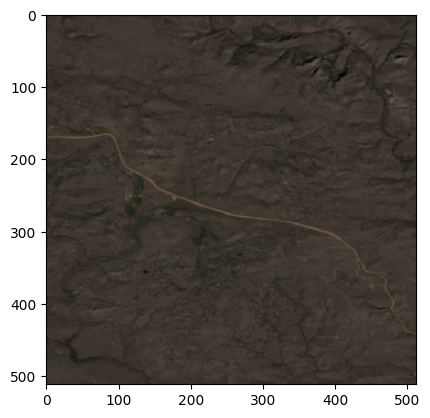

In [121]:
plt.imshow(images_dataset[0])

In [122]:
pred_20_test= model.predict(images_dataset)

1/1 [==============================] - 19s 19s/step


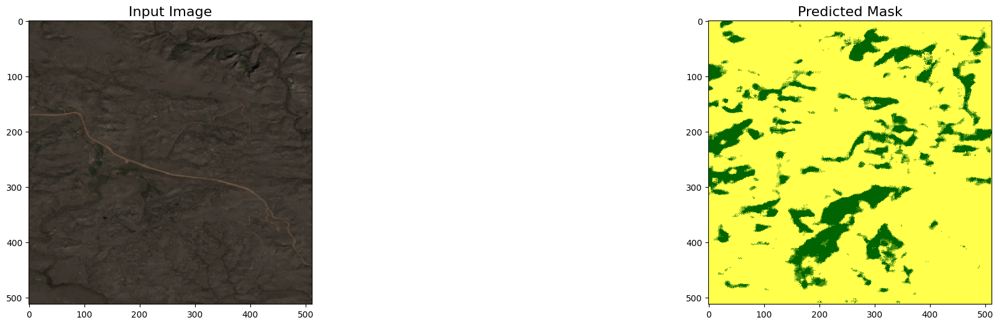

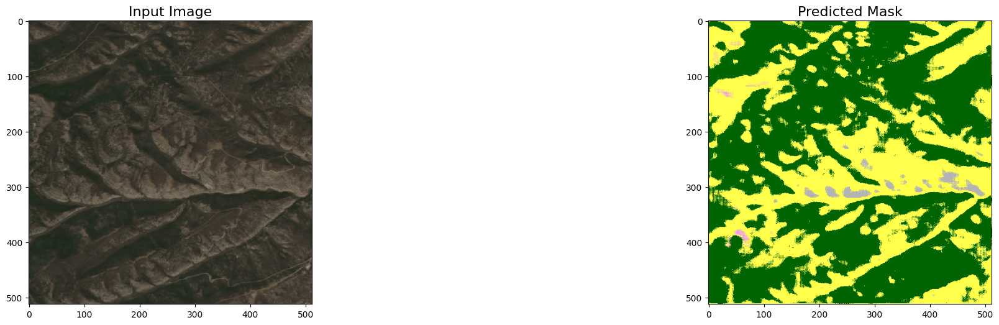

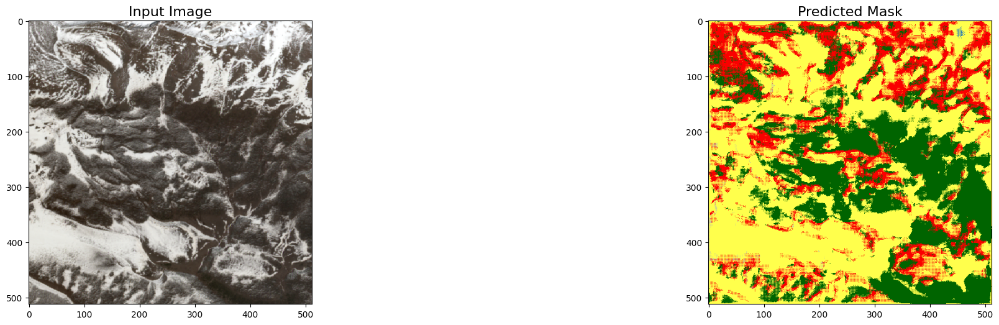

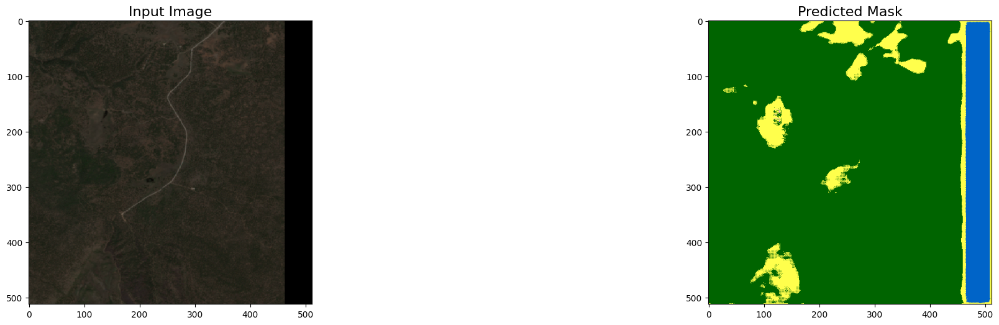

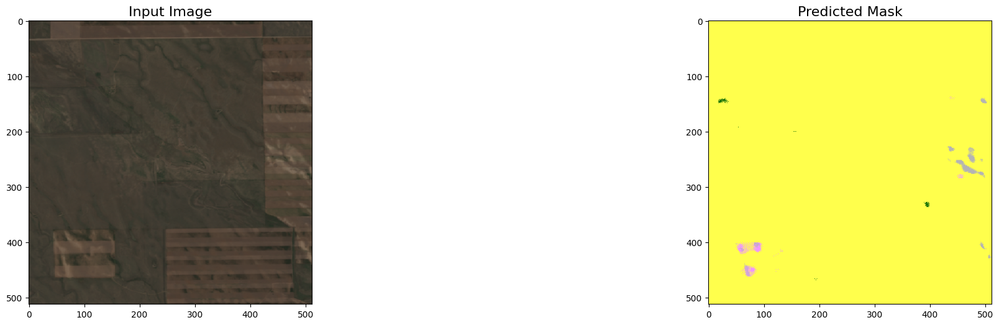

...

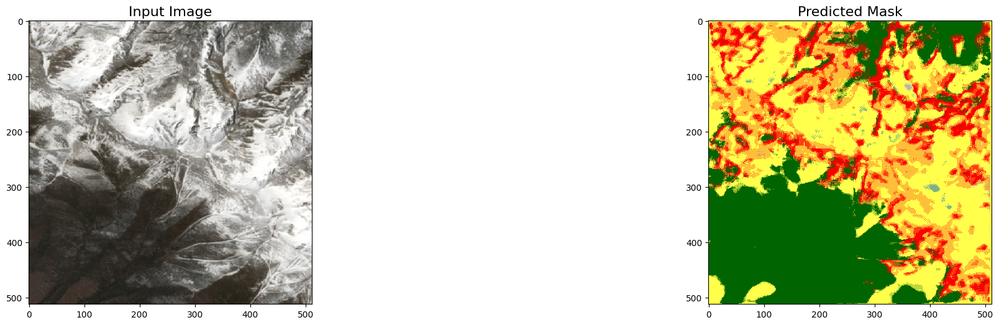

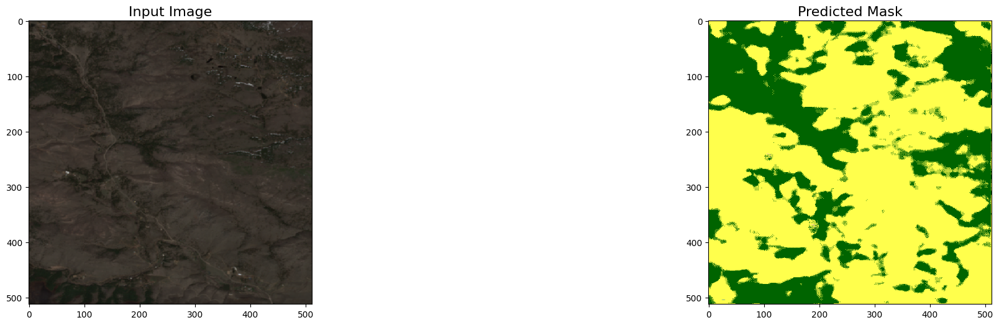

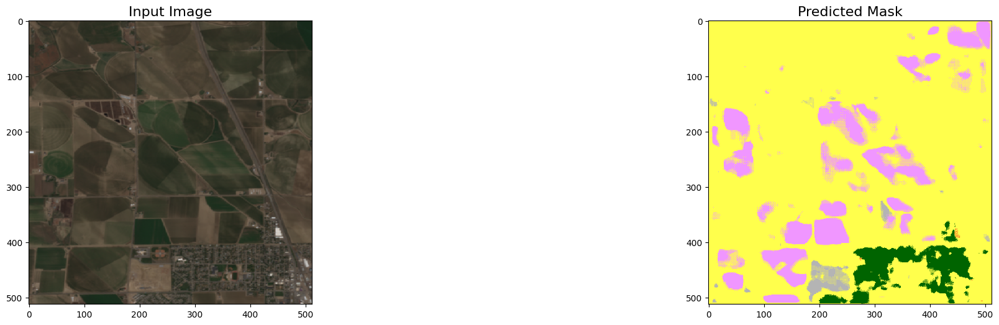

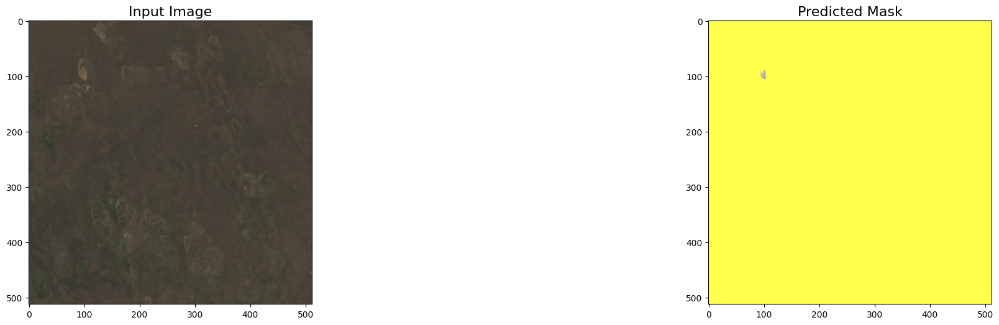

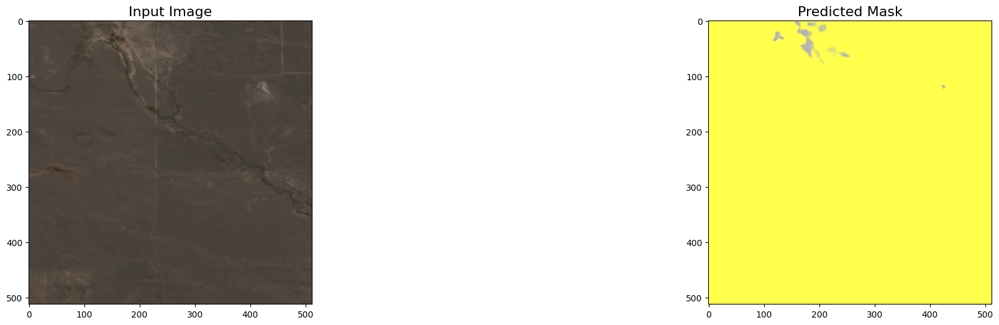

In [123]:
np.shape(pred_20_test)

count = 0
 
for j in range(0,np.shape(pred_20_test)[0]):
    count += 1
    fig = plt.figure(figsize=(20,8))

    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(images_dataset[j])
    ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax1.grid(False)

    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax3.imshow(onehot_to_rgb(pred_20_test[j],id2code))
    ax3.grid(False)

#    plt.savefig('./predictions/prediction_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
    plt.show()

### Start loading data

## Image masks

Value	Color	Description
- 10	#006400	Tree cover 
<p align="center"><div style="background-color: #006400; padding: 10px; "/></p>   
- 20	#ffbb22	Shrubland 
<p align="center"><div style="background-color: #ffbb22; padding: 10px; "/></p>   
- 30	#ffff4c	Grassland
<p align="center"><div style="background-color: #ffff4c; padding: 10px; "/></p>   
- 40	#f096ff	Cropland
<p align="center"><div style="background-color: #f096ff; padding: 10px; "/></p>  
- 50	#fa0000	Built-up
<p align="center"><div style="background-color: #fa0000; padding: 10px; "/></p>  
- 60	#b4b4b4	Bare / sparse vegetation
<p align="center"><div style="background-color: #b4b4b4; padding: 10px; "/></p>  
- 70	#f0f0f0	Snow and ice
<p align="center"><div style="background-color: #f0f0f0; padding: 10px; "/></p>  
- 80	#0064c8	Permanent water bodies
<p align="center"><div style="background-color: #0064c8; padding: 10px; "/></p>  
- 90	#0096a0	Herbaceous wetland
<p align="center"><div style="background-color: #0096a0; padding: 10px; "/></p>  
- 95	#00cf75	Mangroves
<p align="center"><div style="background-color: #00cf75; padding: 10px; "/></p>  
- 100	#fae6a0	Moss and lichen
<p align="center"><div style="background-color: #fae6a0; padding: 10px; "/></p>  

### Preparing labels

In [28]:
labels_dict = {"classes": [
{"title": "Tree cover", "r": 0 , "g": 0 , "b": 0 }, 
{"title": "Shrubland", "r": 0, "g": 0, "b": 0 }, 
{"title": "Grassland", "r": 0, "g": 0, "b": 0 }, 
{"title": "Cropland", "r": 0, "g": 0, "b": 0 }, 
{"title": "Built-up", "r": 0, "g": 0, "b": 0 }, 
{"title": "Bare, sparse vegetation", "r": 0, "g": 0, "b": 0 },
{"title": "Snow and ice", "r": 0, "g": 0, "b": 0 },
{"title": "Permanent water bodies", "r": 0, "g": 0, "b": 0 },
{"title": "Herbaceous wetland", "r": 0, "g": 0, "b": 0 },
{"title": "Mangroves", "r": 0, "g": 0, "b": 0 },
{"title": "Moss and lichen", "r": 0, "g": 0, "b": 0 }
]}


# loading correct rgb values from hex_color list based on ESA  
hex_colors_list = ['#006400', '#ffbb22', '#ffff4c', '#f096ff', '#fa0000',
                    '#b4b4b4', '#f0f0f0', '#0064c8', '#0096a0', '#00cf75', '#fae6a0']

# preparing label df with all information: classes, rgb values

def prepare_labels(labels_dict, hex_colors_list):

    labels_dict_df = pd.DataFrame(labels_dict['classes'])
    
    for i in range(len(hex_colors_list)):
        color = hex_colors_list[i].lstrip('#')
        r = int(color[0:2],16)
        g = int(color[2:4],16)
        b = int(color[4:6],16)
        labels_dict_df.at[i,'r'] = r
        labels_dict_df.at[i,'g'] = g
        labels_dict_df.at[i,'b'] = b
    
    return labels_dict_df

# preparing label codes (just rgb values in order of classes)

def prepare_label_codes(labels_dict, hex_colors_list):
    labels_dict_df = prepare_labels(labels_dict, hex_colors_list)
    
    label_codes = []
    r= np.asarray(labels_dict_df.r)
    g= np.asarray(labels_dict_df.g)
    b= np.asarray(labels_dict_df.b)

    for i in range(len(labels_dict_df)):
        label_codes.append(tuple([r[i], g[i], b[i]]))
    return label_codes

# preparing label names (just class names)

def prepare_label_names(labels_dict, hex_colors_list):
    labels_dict_df = prepare_labels(labels_dict, hex_colors_list)   
    label_names= list(labels_dict_df.title)
    return label_names

# preparing label codes (just rgb values in order of classes)

def prepare_label_codes(labels_dict, hex_colors_list):
    labels_dict_df = prepare_labels(labels_dict, hex_colors_list)
    
    label_codes = []
    r= np.asarray(labels_dict_df.r)
    g= np.asarray(labels_dict_df.g)
    b= np.asarray(labels_dict_df.b)

    for i in range(len(labels_dict_df)):
        label_codes.append(tuple([r[i], g[i], b[i]]))
    return label_codes

# preparing label names (just class names)

def prepare_label_names(labels_dict, hex_colors_list):
    labels_dict_df = prepare_labels(labels_dict, hex_colors_list)   
    label_names= list(labels_dict_df.title)
    return label_names

label_codes = prepare_label_codes(labels_dict, hex_colors_list)
label_names = prepare_label_names(labels_dict, hex_colors_list)

code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [29]:
print(f'label codes are {label_codes}')
print('----')
print(f'label names are {label_names}')

label codes are [(0, 100, 0), (255, 187, 34), (255, 255, 76), (240, 150, 255), (250, 0, 0), (180, 180, 180), (240, 240, 240), (0, 100, 200), (0, 150, 160), (0, 207, 117), (250, 230, 160)]
----
label names are ['Tree cover', 'Shrubland', 'Grassland', 'Cropland', 'Built-up', 'Bare, sparse vegetation', 'Snow and ice', 'Permanent water bodies', 'Herbaceous wetland', 'Mangroves', 'Moss and lichen']


### Functions to One-hot Encode RGB Labels/Masks and Decoding Encoded Predictions

In [30]:
# one-hot encoder 
def rgb_to_onehot(rgb_mask_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 512 x 512 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    rgb_mask_to_encode = rgb_mask_image*255
#    print(f'shape of mask to encode is {rgb_mask_to_encode.shape}')
    # shape prepared for image size and channels = num of classes (instead of 3 RGB colors)
    shape = rgb_mask_to_encode.shape[:2]+(num_classes,)
#    print(f'prepared shape for encoded mask is {shape}')
    
    # encoded_image prepare array with right shaoe 
    encoded_mask = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        # image.reshape flattens and keeps 3 channels, then checks which pixels same as color in colormap
        # then change back to image size for each of 6 channels (based on colormap)
        encoded_mask[:,:,i] = np.all(rgb_mask_to_encode.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    
#    print(f'encoded mask shape is {encoded_mask.shape}')
    return encoded_mask

def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

#def preprocess_images (images):
#    images = images/255.
#    return images

#def encoding_masks(masks_dataset, colormap = id2code):
#    encoded_masks = []
##    print(f'range is {len(masks_dataset)}')
#    
#    for i in range(len(masks_dataset)): 
#        mask = masks_dataset[i]
#        encoded_mask = rgb_to_onehot(mask, colormap)
#        encoded_masks.append(encoded_mask)
#    
#    encoded_masks = np.array(encoded_masks) 
#    return encoded_masks

## Model

### Loading X and y, split train, test

In [ ]:
# Preparing X(images) and y(labels) 
y = encoding_masks(masks_dataset[0:TRIAL_SIZE])
X = preprocess_images (images_dataset[0:TRIAL_SIZE])

In [ ]:
# Finally we shuffle:
p = np.random.permutation(len(X))
X, y = X[p], y[p]

# split is for train/val data and for test data
split = int(len(X) /6.) 
X_test, X_train = X[:split], X[split:]
y_test, y_train = y[:split], y[split:] 

In [ ]:
len(X_test), len(X_train), len(y_test), len(y_train)

In [ ]:
X_test.shape, X_train.shape, y_test.shape, y_train.shape

In [ ]:
# random check of 6 masks and respective images

i = random.randint(0, len(y_train)-5)

f, ax = plt.subplots(2, 6, figsize=(15, 5)) 

ax[0,0].imshow(onehot_to_rgb(y_train[i]))
ax[0,1].imshow(onehot_to_rgb(y_train[i+1]))
ax[0,2].imshow(onehot_to_rgb(y_train[i+2]))
ax[0,3].imshow(onehot_to_rgb(y_train[i+3]))
ax[0,4].imshow(onehot_to_rgb(y_train[i+4]))
ax[0,5].imshow(onehot_to_rgb(y_train[i+5]))


ax[1,0].imshow(X_train[i])
ax[1,1].imshow(X_train[i+1])
ax[1,2].imshow(X_train[i+2])
ax[1,3].imshow(X_train[i+3])
ax[1,4].imshow(X_train[i+4])
ax[1,5].imshow(X_train[i+5])

### Setting up InceptionResNetV2 UNet

In [75]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_inception_resnetv2_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained InceptionResNetV2 Model """
    encoder = InceptionResNetV2(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = encoder.get_layer("input_1").output           ## (512 x 512)

    s2 = encoder.get_layer("activation").output        ## (255 x 255)
    s2 = ZeroPadding2D(( (1, 0), (1, 0) ))(s2)         ## (256 x 256)

    s3 = encoder.get_layer("activation_3").output      ## (126 x 126)
    s3 = ZeroPadding2D((1, 1))(s3)                     ## (128 x 128)

    s4 = encoder.get_layer("activation_74").output      ## (61 x 61)
    s4 = ZeroPadding2D(( (2, 1),(2, 1) ))(s4)           ## (64 x 64)

    """ Bridge """
    b1 = encoder.get_layer("activation_161").output     ## (30 x 30)
    b1 = ZeroPadding2D((1, 1))(b1)                      ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)
    
    """ Output """
    dropout = Dropout(0.3)(d4)
    outputs = Conv2D(11, 1, padding="same", activation="softmax")(dropout)

    model = Model(inputs, outputs, name="InceptionResNetV2-UNet")
    return model

In [76]:
K.clear_session()

def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

model = build_inception_resnetv2_unet(input_shape = (512, 512, 3))
model.compile(optimizer=Adam(lr = 0.0001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])
model.summary()

Model: "InceptionResNetV2-UNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                            

### Modelling

In [78]:
# Define key parameters for training the model + savings results
PATIENCE = 4
#BATCH_SIZE = 1 # smaller potentially better for model to perform, but means more epochs

#steps_per_epoch = np.ceil(float(len(X_train)*0.8) / float(BATCH_SIZE))
#print('steps_per_epoch: ', steps_per_epoch)

#validation_steps = np.ceil(float(len(X_train)*0.2) / float(BATCH_SIZE))
#print('validation_steps: ', validation_steps)

In [79]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 60)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = model_path,
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

earlystop = EarlyStopping(
    monitor = 'val_loss', 
    min_delta = 0.001, 
    patience = PATIENCE, 
    mode = 'auto', 
    verbose = 1,
    restore_best_weights = True
)

csvlogger = CSVLogger(
    filename = results_path,
    separator = ",",
    append = False
)

callbacks = [checkpoint, earlystop, csvlogger, lr_scheduler]

In [81]:
history = model.fit(
    ds,
    batch_size=BATCH_SIZE,
#    validation_split = 0.2, 
    epochs = 50,
    callbacks=callbacks, 
    verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/50


2023-06-13 11:11:12.684786: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inInceptionResNetV2-UNet/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-06-13 11:11:20.268998: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8200
2023-06-13 11:11:31.453653: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.97GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-06-13 11:11:31.453728: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.97GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available

ResourceExhaustedError: Graph execution error:

Detected at node 'InceptionResNetV2-UNet/conv2d_207/Conv2D' defined at (most recent call last):
    File "/opt/conda/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/opt/conda/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/opt/conda/lib/python3.10/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/opt/conda/lib/python3.10/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/opt/conda/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
      self._run_once()
    File "/opt/conda/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once
      handle._run()
    File "/opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/opt/conda/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/var/tmp/ipykernel_40416/3332679588.py", line 1, in <module>
      history = model.fit(
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 1650, in fit
      tmp_logs = self.train_function(iterator)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 1249, in train_function
      return step_function(self, iterator)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 1233, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 1222, in run_step
      outputs = model.train_step(data)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 1023, in train_step
      y_pred = self(x, training=True)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/training.py", line 561, in __call__
      return super().__call__(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/base_layer.py", line 1132, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/functional.py", line 511, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/functional.py", line 668, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/engine/base_layer.py", line 1132, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/opt/conda/lib/python3.10/site-packages/keras/layers/convolutional/base_conv.py", line 283, in call
      outputs = self.convolution_op(inputs, self.kernel)
    File "/opt/conda/lib/python3.10/site-packages/keras/layers/convolutional/base_conv.py", line 255, in convolution_op
      return tf.nn.convolution(
Node: 'InceptionResNetV2-UNet/conv2d_207/Conv2D'
OOM when allocating tensor with shape[16,128,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node InceptionResNetV2-UNet/conv2d_207/Conv2D}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_103043]

### Loading results and making predictions

In [ ]:
# if model doesn't finish, this will not work
# then we load it from the cvs result

df_result = pd.DataFrame(history.history)
df_result

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(40, 5))
ax = ax.ravel()
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(history.history[met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        
plt.savefig(model_metrics_plot_path, facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 150)

In [ ]:
model.load_weights(model_path)

In [ ]:
pred_all= model.predict(X_test)

In [ ]:
# visualized all prediction and save the combo: 
#    - image, ground truth mask, predicted mask
# as a file

np.shape(pred_all)

count = 0
 
for j in range(0,np.shape(pred_all)[0]):
    count += 1
    fig = plt.figure(figsize=(20,8))

    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[j])
    ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax1.grid(False)

    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax2.imshow(onehot_to_rgb(batch_mask[j],id2code))
    ax2.grid(False)

    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax3.imshow(onehot_to_rgb(pred_all[j],id2code))
    ax3.grid(False)

#    plt.savefig('./predictions/prediction_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
    plt.show()